# Stage 2: Airbnb Amsterdam  - EDA (Explanatory Data Analysis)

by Orit Ophir

In [1]:
import numpy as np
import os 
import pandas as pd
from pandas_profiling import ProfileReport
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn import ensemble, tree, linear_model
from sklearn import tree
from sklearn.metrics import accuracy_score
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer
from scipy.stats import pearsonr
import pyodbc
import seaborn as sns
sns.set()
plt.style.use('seaborn')
import re
from scipy import stats
from scipy.stats import chisquare
from scipy.stats import chi2_contingency
from scipy.stats import f_oneway
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.stats import ks_2samp
from scipy.stats import norm
import missingno as msno
import warnings
import datetime
warnings.filterwarnings("ignore")
import nltk
#nltk.download('popular')
nltk.download('punkt')
nltk.download('wordnet')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\ophir\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\ophir\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

Uploading data file:

In [190]:
df = pd.read_csv('amsterdam_final_data.csv')
df.head()

,Unnamed: 0,id,host_id,host_location,host_response_time,host_response_rate,host_is_superhost,host_neighbourhood,host_total_listings_count,host_has_profile_pic,...,_'jumio',_'facebook',_'offline_government_id',_'government_id',_'selfie',_'identity_manual',_'work_email',_'google','phone',_'manual_offline'
0,0,5957043,30922450,Netherlands,NaN,NaN,0.0,NaN,1.0,1.0,...,1,0,0,0,0,0,0,0,0,0
1,1,12279014,66160250,Netherlands,NaN,NaN,0.0,NaN,1.0,1.0,...,1,1,0,0,0,0,0,0,0,0
2,2,13824148,79317608,Netherlands,within a few hours,100.0,1.0,NaN,1.0,1.0,...,1,1,0,0,0,0,0,0,0,0
3,3,15350277,18571882,Netherlands,NaN,NaN,0.0,NaN,1.0,1.0,...,1,1,1,1,0,0,0,0,0,0
4,4,15885709,28689390,Netherlands,NaN,NaN,0.0,NaN,1.0,1.0,...,1,0,0,0,0,0,0,0,0,0


In [191]:
#common error uppon dataset upload
del  df['Unnamed: 0']

Columns information:

In [115]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20030 entries, 0 to 20029
Columns: 159 entries, id to _'manual_offline'
dtypes: float64(26), int64(123), object(10)
memory usage: 24.3+ MB


In [116]:
df.shape

(20030, 159)

# Data Protocol

Exporting results to the protocol

In [78]:
# Type of valaues 
df.dtypes.to_excel("Amsterdam_datatype.xlsx",
             sheet_name='data_type')
# Maximum valaues 
df.max().to_excel("max_amsterdam.xlsx",
             sheet_name='max')
# Minimum Values
df.min().to_excel("min_amsterdam.xlsx",
             sheet_name='min')
# Missing Values
df.isnull().sum(axis=0).to_excel("NA_amsterdam.xlsx",
             sheet_name='NA')
# exporting results to the protocol
df.nunique().to_excel("unique_amsterdam.xlsx",
             sheet_name='unique')

In [192]:
#get dummies
df_dummy = df[[col for col in df if np.isin(df[col].dropna().unique(), [0, 1]).all()]]
df_dummy.shape

(20030, 114)

In [193]:
#get all numeric data
cols = df.columns
df_num = df._get_numeric_data().columns.dropna().unique()
df_num.shape

(149,)

In [194]:
df_num_non_dummy = df[set(df_num)-set(df_dummy)]
df_num_non_dummy.drop(['id', 'host_id'], axis=1, inplace=True)
df_num_non_dummy.shape

(20030, 33)

In [195]:
#get categorial data
df_categorial=df[list(set(cols) - set(df_num))]
df_categorial.shape

(20030, 10)

# Descriptive Statistics

Initial reports performed by Sweetwiz providing us with instant overview of data behavior

### Sweetwiz

In [62]:
#import sweetviz as sv
#sweet_report = sv.analyze(df)
#sweet_report.show_html('airbnb_amsterdam_sweetwiz_report.html')

                                             |          | [  0%]   00:00 -> (? left)

Report airbnb_amsterdam_sweetwiz_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


### Autoviz report

Shape of your Data Set loaded: (20030, 160)
############## C L A S S I F Y I N G  V A R I A B L E S  ####################
Classifying variables in data set...
    160 Predictors classified...
        3 variables removed since they were ID or low-information variables
23 numeric variables in data exceeds limit, taking top 30 variables
Number of All Scatter Plots = 276


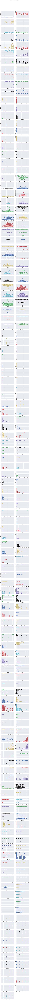

Could not draw Distribution Plot


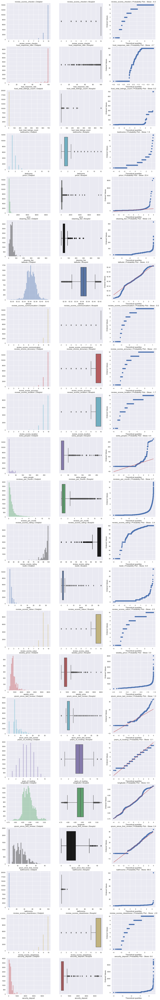

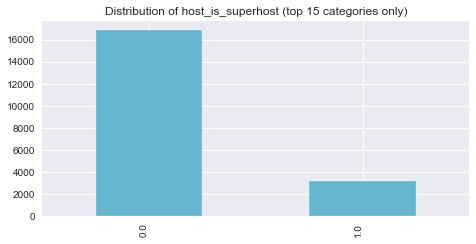

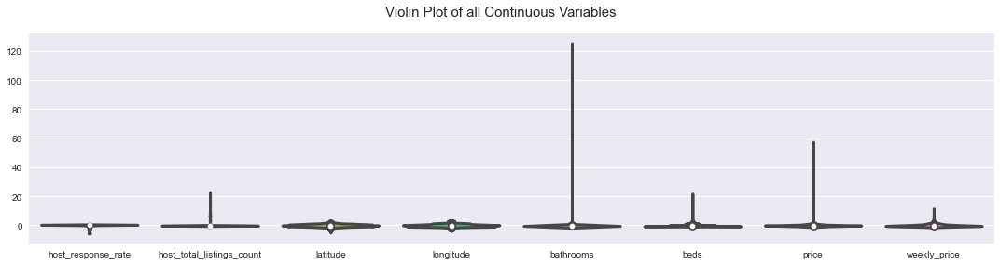

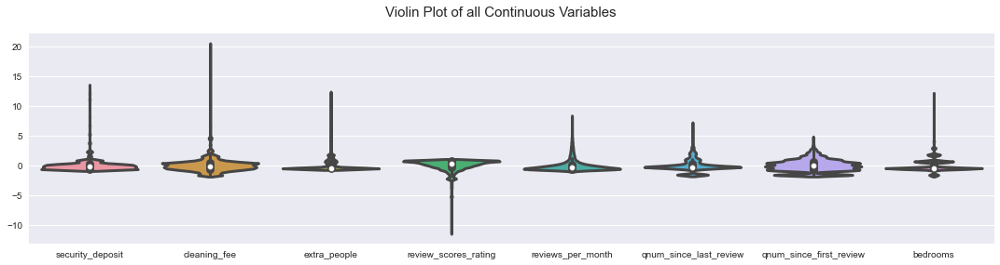

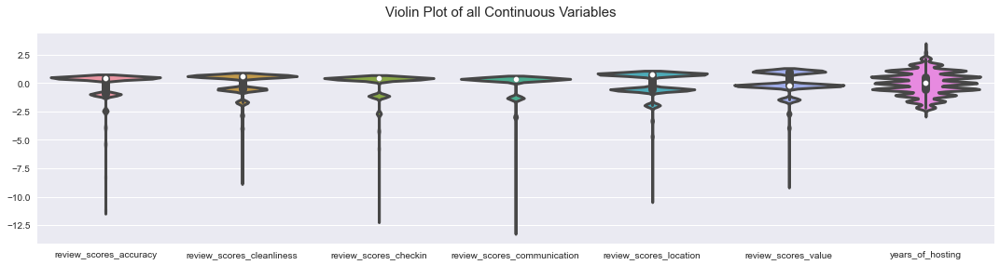

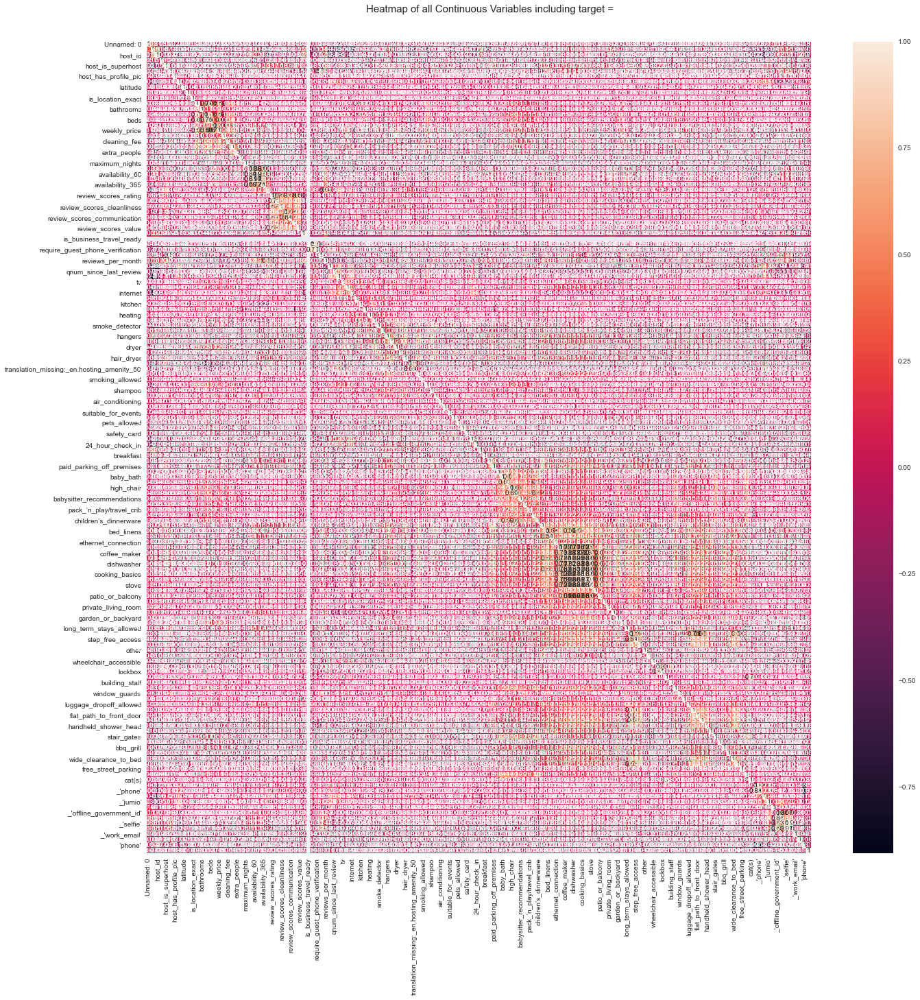

ValueError: Image size of 1440x534240 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 1440x534240 with 2967 Axes>

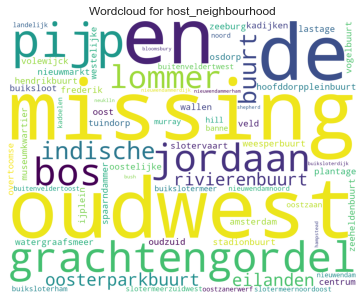

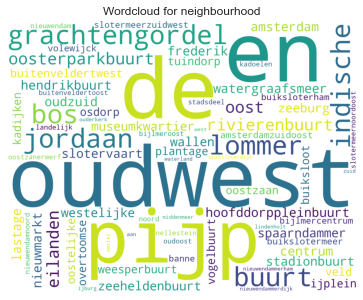

Time to run AutoViz = 1149 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


,Unnamed: 0,id,host_id,host_location,host_response_time,host_response_rate,host_is_superhost,host_neighbourhood,host_total_listings_count,host_has_profile_pic,...,_'jumio',_'facebook',_'offline_government_id',_'government_id',_'selfie',_'identity_manual',_'work_email',_'google','phone',_'manual_offline'
0,0,5957043,30922450,Netherlands,NaN,NaN,0.0,NaN,1.0,1.0,...,1,0,0,0,0,0,0,0,0,0
1,1,12279014,66160250,Netherlands,NaN,NaN,0.0,NaN,1.0,1.0,...,1,1,0,0,0,0,0,0,0,0
2,2,13824148,79317608,Netherlands,within a few hours,100.0,1.0,NaN,1.0,1.0,...,1,1,0,0,0,0,0,0,0,0
3,3,15350277,18571882,Netherlands,NaN,NaN,0.0,NaN,1.0,1.0,...,1,1,1,1,0,0,0,0,0,0
4,4,15885709,28689390,Netherlands,NaN,NaN,0.0,NaN,1.0,1.0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20025,20025,28830788,60865851,NaN,within a few hours,100.0,0.0,Hoofddorppleinbuurt,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
20026,20026,29230120,94786135,NaN,within an hour,100.0,0.0,Frederik Hendrikbuurt,1.0,1.0,...,0,0,0,0,0,0,0,0,1,0
20027,20027,29275952,66608213,NaN,NaN,NaN,0.0,NaN,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0
20028,20028,30166752,74976114,NaN,NaN,NaN,0.0,Oud-West,1.0,1.0,...,0,0,0,0,0,0,0,0,0,0


In [11]:
#from autoviz.AutoViz_Class import AutoViz_Class
#%matplotlib inline
#AV = AutoViz_Class()
#AV.AutoViz('amsterdam_final_data.csv')

# Descriptive Statistics

In [13]:
df.iloc[:,:30].describe()

,id,host_id,host_response_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,is_location_exact,...,bedrooms,beds,price,weekly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights
count,2.003000e+04,2.003000e+04,10547.000000,20026.000000,20026.000000,20026.000000,20026.000000,20030.000000,20030.000000,20030.000000,...,20022.00000,20023.000000,20030.000000,2843.000000,13864.000000,16401.000000,20030.000000,20030.000000,20030.000000,20030.000000
mean,1.541725e+07,4.868570e+07,93.755950,0.158294,6.105812,0.998951,0.413013,52.365212,4.888977,0.698053,...,1.44506,1.849223,152.181178,821.054872,221.875577,39.271569,1.468997,11.315876,3.328707,631.225711
std,8.569404e+06,5.649635e+07,17.034864,0.365026,30.388516,0.032366,0.492387,0.015996,0.035573,0.459114,...,0.88568,1.389664,145.828976,458.844485,340.210814,24.268398,0.937890,22.152063,12.537419,541.339981
min,2.818000e+03,3.159000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,52.288378,4.753247,0.000000,...,0.00000,0.000000,0.000000,100.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000
25%,8.188423e+06,8.093516e+06,100.000000,0.000000,1.000000,1.000000,0.000000,52.355126,4.863595,0.000000,...,1.00000,1.000000,96.000000,550.000000,0.000000,25.000000,1.000000,0.000000,2.000000,21.000000
50%,1.563049e+07,2.369450e+07,100.000000,0.000000,1.000000,1.000000,0.000000,52.364590,4.886387,1.000000,...,1.00000,1.000000,125.000000,700.000000,150.000000,35.000000,1.000000,0.000000,2.000000,1125.000000
75%,2.202577e+07,6.827535e+07,100.000000,0.000000,1.000000,1.000000,1.000000,52.375074,4.908288,1.000000,...,2.00000,2.000000,175.000000,950.000000,295.000000,50.000000,2.000000,20.000000,3.000000,1125.000000
max,3.058041e+07,2.293612e+08,100.000000,1.000000,698.000000,1.000000,1.000000,52.424713,5.027689,1.000000,...,12.00000,32.000000,8500.000000,6000.000000,4736.000000,531.000000,16.000000,280.000000,1001.000000,9999.000000


In [14]:
df.iloc[:,30:60].describe()

,availability_30,availability_60,availability_90,availability_365,number_of_reviews,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,...,years_of_hosting,qnum_since_last_review,qnum_since_first_review,tv,cable_tv,internet,wifi,kitchen,free_parking_on_premises,heating
count,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,17391.000000,17381.000000,17383.000000,17369.000000,17378.000000,...,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000
mean,4.905642,11.411233,18.168597,59.913679,21.560459,94.849520,9.679765,9.465627,9.735563,9.785361,...,4.996256,6.101648,11.452521,0.779730,0.395956,0.373240,0.972042,0.912831,0.095706,0.965652
std,7.942903,17.498603,27.704834,104.027710,43.240292,6.648685,0.685271,0.867973,0.646557,0.599409,...,1.860757,3.864363,7.118872,0.414439,0.489067,0.483677,0.164857,0.282090,0.294196,0.182127
min,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000,2.000000,2.000000,2.000000,2.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,3.000000,93.000000,9.000000,9.000000,10.000000,10.000000,...,4.000000,5.000000,6.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000
50%,0.000000,0.000000,0.000000,3.000000,8.000000,97.000000,10.000000,10.000000,10.000000,10.000000,...,5.000000,5.000000,11.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000
75%,7.000000,18.000000,28.000000,67.000000,22.000000,100.000000,10.000000,10.000000,10.000000,10.000000,...,6.000000,7.000000,16.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000
max,30.000000,60.000000,90.000000,365.000000,695.000000,100.000000,10.000000,10.000000,10.000000,10.000000,...,11.000000,33.000000,44.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [15]:
df.iloc[:,60:90].describe()

,washer,smoke_detector,essentials,hangers,iron,dryer,carbon_monoxide_detector,hair_dryer,translation_missing:_en.hosting_amenity_49,translation_missing:_en.hosting_amenity_50,...,hot_tub,safety_card,buzzer/wireless_intercom,24_hour_check_in,private_entrance,breakfast,host_greets_you,paid_parking_off_premises,baby_monitor,baby_bath
count,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.00000,20030.000000,20030.000000,...,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000
mean,0.759261,0.787269,0.959311,0.707039,0.661757,0.444783,0.377933,0.65352,0.186720,0.239840,...,0.028657,0.135846,0.150674,0.096355,0.271942,0.069695,0.310734,0.241088,0.012082,0.024863
std,0.427543,0.409249,0.197574,0.455132,0.473123,0.496954,0.484883,0.47586,0.389696,0.426996,...,0.166845,0.342634,0.357740,0.295085,0.444971,0.254639,0.462806,0.427754,0.109254,0.155711
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [16]:
df.iloc[:,90:120].describe()

,changing_table,high_chair,children’s_books_and_toys,babysitter_recommendations,crib,pack_’n_play/travel_crib,room_darkening_shades,children’s_dinnerware,hot_water,bed_linens,...,single_level_home,patio_or_balcony,waterfront,private_living_room,lock_on_bedroom_door,garden_or_backyard,indoor_fireplace,long_term_stays_allowed,wide_doorway,step_free_access
count,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,...,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000
mean,0.029256,0.077683,0.089715,0.025861,0.062906,0.033300,0.040739,0.043684,0.465252,0.269246,...,0.054019,0.161458,0.037943,0.101797,0.138143,0.068347,0.055517,0.121018,0.048827,0.062556
std,0.168528,0.267680,0.285781,0.158725,0.242799,0.179423,0.197690,0.204397,0.498804,0.443579,...,0.226061,0.367962,0.191063,0.302389,0.345058,0.252348,0.228992,0.326157,0.215511,0.242169
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [17]:
df.iloc[:,120:-1].describe()

,accessible_height_bed,other,paid_parking_on_premises,wheelchair_accessible,self_check_in,lockbox,pets_live_on_this_property,building_staff,bathtub,window_guards,...,_'reviews',_'jumio',_'facebook',_'offline_government_id',_'government_id',_'selfie',_'identity_manual',_'work_email',_'google','phone'
count,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,...,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000
mean,0.038692,0.063605,0.074588,0.046380,0.061008,0.040489,0.055617,0.010884,0.075637,0.019920,...,0.845382,0.609935,0.243435,0.220070,0.275537,0.178832,0.172441,0.123615,0.046380,0.055567
std,0.192865,0.244053,0.262732,0.210313,0.239352,0.197109,0.229186,0.103758,0.264422,0.139729,...,0.361549,0.487777,0.429166,0.414304,0.446795,0.383221,0.377773,0.329150,0.210313,0.229089
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [18]:
df.describe()

,id,host_id,host_response_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,latitude,longitude,is_location_exact,...,_'jumio',_'facebook',_'offline_government_id',_'government_id',_'selfie',_'identity_manual',_'work_email',_'google','phone',_'manual_offline'
count,2.003000e+04,2.003000e+04,10547.000000,20026.000000,20026.000000,20026.000000,20026.000000,20030.000000,20030.000000,20030.000000,...,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000
mean,1.541725e+07,4.868570e+07,93.755950,0.158294,6.105812,0.998951,0.413013,52.365212,4.888977,0.698053,...,0.609935,0.243435,0.220070,0.275537,0.178832,0.172441,0.123615,0.046380,0.055567,0.021468
std,8.569404e+06,5.649635e+07,17.034864,0.365026,30.388516,0.032366,0.492387,0.015996,0.035573,0.459114,...,0.487777,0.429166,0.414304,0.446795,0.383221,0.377773,0.329150,0.210313,0.229089,0.144941
min,2.818000e+03,3.159000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,52.288378,4.753247,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8.188423e+06,8.093516e+06,100.000000,0.000000,1.000000,1.000000,0.000000,52.355126,4.863595,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.563049e+07,2.369450e+07,100.000000,0.000000,1.000000,1.000000,0.000000,52.364590,4.886387,1.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2.202577e+07,6.827535e+07,100.000000,0.000000,1.000000,1.000000,1.000000,52.375074,4.908288,1.000000,...,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,3.058041e+07,2.293612e+08,100.000000,1.000000,698.000000,1.000000,1.000000,52.424713,5.027689,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [19]:
df_dummy.iloc[:,:55].describe()


,host_is_superhost,host_has_profile_pic,host_identity_verified,is_location_exact,instant_bookable,is_business_travel_ready,require_guest_profile_picture,require_guest_phone_verification,tv,cable_tv,...,changing_table,high_chair,children’s_books_and_toys,babysitter_recommendations,crib,pack_’n_play/travel_crib,room_darkening_shades,children’s_dinnerware,hot_water,bed_linens
count,20026.000000,20026.000000,20026.000000,20030.000000,20030.000000,20030.0,20030.000000,20030.000000,20030.000000,20030.000000,...,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000
mean,0.158294,0.998951,0.413013,0.698053,0.239641,0.0,0.012332,0.016126,0.779730,0.395956,...,0.029256,0.077683,0.089715,0.025861,0.062906,0.033300,0.040739,0.043684,0.465252,0.269246
std,0.365026,0.032366,0.492387,0.459114,0.426875,0.0,0.110363,0.125963,0.414439,0.489067,...,0.168528,0.267680,0.285781,0.158725,0.242799,0.179423,0.197690,0.204397,0.498804,0.443579
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,1.000000,0.000000,1.000000,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,1.000000,1.000000,0.000000,0.0,0.000000,0.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [20]:
df_dummy.iloc[:,:55:-1].describe()

,_'manual_offline','phone',_'google',_'work_email',_'identity_manual',_'selfie',_'government_id',_'offline_government_id',_'facebook',_'jumio',...,single_level_home,stove,oven,cooking_basics,dishes_and_silverware,dishwasher,refrigerator,coffee_maker,microwave,ethernet_connection
count,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,...,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000
mean,0.021468,0.055567,0.046380,0.123615,0.172441,0.178832,0.275537,0.220070,0.243435,0.609935,...,0.054019,0.232102,0.235946,0.231503,0.266301,0.212431,0.277434,0.240639,0.191862,0.028707
std,0.144941,0.229089,0.210313,0.329150,0.377773,0.383221,0.446795,0.414304,0.429166,0.487777,...,0.226061,0.422184,0.424599,0.421803,0.442034,0.409039,0.447744,0.427482,0.393775,0.166986
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [21]:
df_dummy.describe()

,host_is_superhost,host_has_profile_pic,host_identity_verified,is_location_exact,instant_bookable,is_business_travel_ready,require_guest_profile_picture,require_guest_phone_verification,tv,cable_tv,...,_'jumio',_'facebook',_'offline_government_id',_'government_id',_'selfie',_'identity_manual',_'work_email',_'google','phone',_'manual_offline'
count,20026.000000,20026.000000,20026.000000,20030.000000,20030.000000,20030.0,20030.000000,20030.000000,20030.000000,20030.000000,...,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000,20030.000000
mean,0.158294,0.998951,0.413013,0.698053,0.239641,0.0,0.012332,0.016126,0.779730,0.395956,...,0.609935,0.243435,0.220070,0.275537,0.178832,0.172441,0.123615,0.046380,0.055567,0.021468
std,0.365026,0.032366,0.492387,0.459114,0.426875,0.0,0.110363,0.125963,0.414439,0.489067,...,0.487777,0.429166,0.414304,0.446795,0.383221,0.377773,0.329150,0.210313,0.229089,0.144941
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,1.000000,0.000000,1.000000,0.000000,0.0,0.000000,0.000000,1.000000,0.000000,...,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,1.000000,1.000000,0.000000,0.0,0.000000,0.000000,1.000000,1.000000,...,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


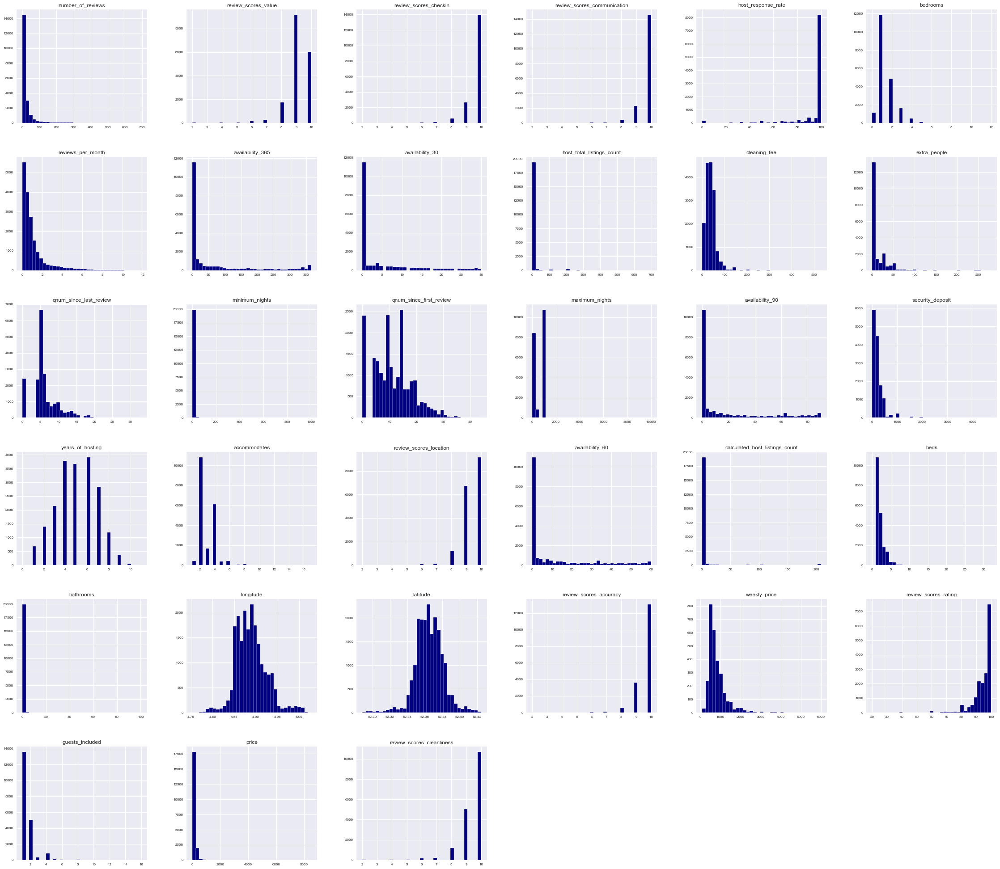

In [75]:
df_num_non_dummy.hist(figsize=(35, 35), bins=35, xlabelsize=8, ylabelsize=8, color = "navy");

We can see that data is skewed, let's measure the asymmetry of the distribution:

In [196]:
def highlight(cell_value):
    highlight = 'background-color: mediumspringgreen;'
    default = ''
    negative = 'background-color: hotpink;'
    if cell_value > 1:
        return highlight
    elif cell_value < -1:
        return negative
    #else
       # return default  
pd.DataFrame(df_num_non_dummy.skew(),columns=['skewness']).sort_values(by='skewness', ascending=False).style.applymap(highlight)

,skewness
bathrooms,98.638765
minimum_nights,56.361392
price,25.447702
host_total_listings_count,8.158636
calculated_host_listings_count,7.854948
security_deposit,6.559608
number_of_reviews,5.415026
guests_included,4.815246
beds,4.794252
extra_people,4.366211


20 data columns are positively skewed (skewness > 1), 7 columns are negativley skewed (skewness < -1) later we'll see if outliers or missing values can affect the features distribution.

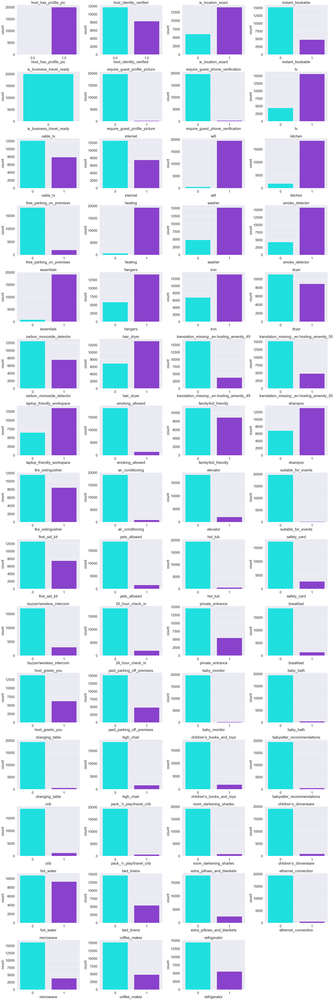

In [37]:
a = 15  # number of rows
b = 4  # number of columns
c = 1  # plot counter

fig = plt.figure(figsize=(30,90))
plt.subplots_adjust(hspace = 0.8)
sns.set(font_scale = 2)
for i in df_dummy.iloc[:,:60]:
    if i != 'host_is_superhost':
        plt.subplot(a, b, c)
        plt.title('{}'.format(i))
        plt.xlabel(i)
        sns.countplot(df_dummy[i], palette=['aqua','blueviolet'])
        c = c + 1
fig.tight_layout()
plt.show()

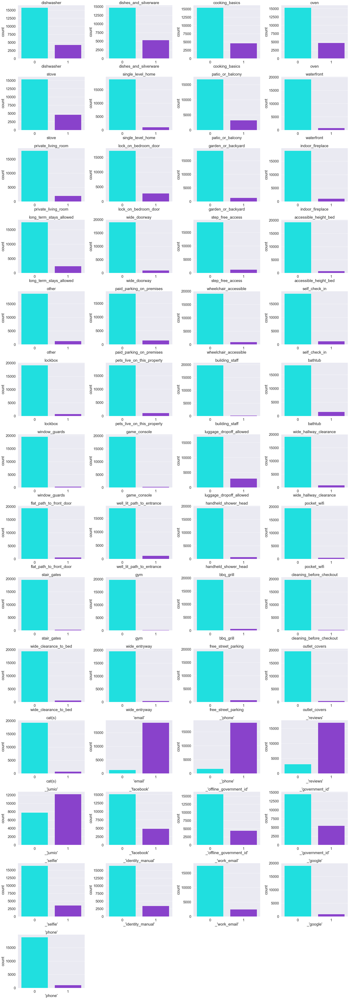

In [38]:
a = 15  # number of rows
b = 4  # number of columns
c = 1  # plot counter

fig = plt.figure(figsize=(30,90))
plt.subplots_adjust(hspace = 0.8)
sns.set(font_scale = 2)
for i in df_dummy.iloc[:,60:-1]:
    if i != 'host_is_superhost':
        plt.subplot(a, b, c)
        plt.title('{}'.format(i))
        plt.xlabel(i)
        sns.countplot(df_dummy[i], palette=['aqua','blueviolet'])
        c = c + 1
fig.tight_layout()
plt.show()

In [23]:
df_categorial

,neighbourhood,host_neighbourhood,calendar_updated,cancellation_policy,room_type,bed_type,host_response_time,property_type,host_location,neighbourhood_cleansed
0,Bijlmer-Oost,NaN,24-35 month ago,strict_14_with_grace_period,Entire home/apt,Real Bed,NaN,Apartment,Netherlands,Bijlmer-Oost
1,Oosterparkbuurt,NaN,12-23 month ago,moderate,Entire home/apt,Real Bed,NaN,Apartment,Netherlands,Oud-Oost
2,Frederik Hendrikbuurt,NaN,This week,strict_14_with_grace_period,Entire home/apt,Real Bed,within a few hours,Boat,Netherlands,Westerpark
3,Oud-West,NaN,24-35 month ago,strict_14_with_grace_period,Entire home/apt,Real Bed,NaN,Apartment,Netherlands,De Baarsjes - Oud-West
4,Oud-West,NaN,12-23 month ago,moderate,Entire home/apt,Real Bed,NaN,Apartment,Netherlands,Westerpark
...,...,...,...,...,...,...,...,...,...,...
20025,Hoofddorppleinbuurt,Hoofddorppleinbuurt,2-3 months ago,flexible,Entire home/apt,Real Bed,within a few hours,Apartment,NaN,Zuid
20026,Frederik Hendrikbuurt,Frederik Hendrikbuurt,1-3 weeks ago,flexible,Entire home/apt,Real Bed,within an hour,Apartment,NaN,Westerpark
20027,Nellestein,NaN,2-3 months ago,flexible,Entire home/apt,Real Bed,NaN,Condominium,NaN,Gaasperdam - Driemond
20028,Oud-West,Oud-West,This week,flexible,Entire home/apt,Real Bed,NaN,Apartment,NaN,Westerpark


In [24]:
df_categorial.shape

(20030, 10)

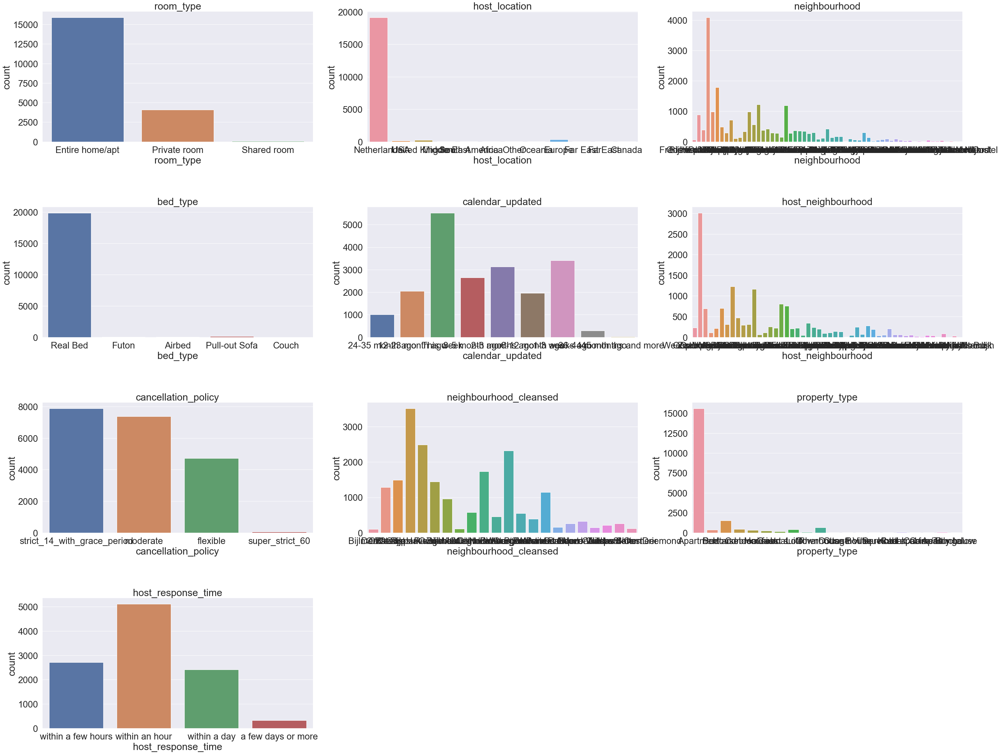

In [44]:
a = 4  # number of rows
b = 3  # number of columns
c = 1  # plot counter

fig = plt.figure(figsize=(50,40))
plt.subplots_adjust(hspace = 0.5)
sns.set(font_scale = 2.5)
for i in df_categorial:

        plt.subplot(a, b, c)
        plt.title('{}'.format(i))
        plt.xlabel(i)
        sns.countplot(df_categorial[i])
        c = c + 1

plt.show()

In [25]:
#### Distribution of the target variable - Host is Superhost:

In [26]:
df['host_is_superhost'].describe()

count    20026.000000
mean         0.158294
std          0.365026
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: host_is_superhost, dtype: float64

<AxesSubplot:xlabel='host_is_superhost', ylabel='count'>

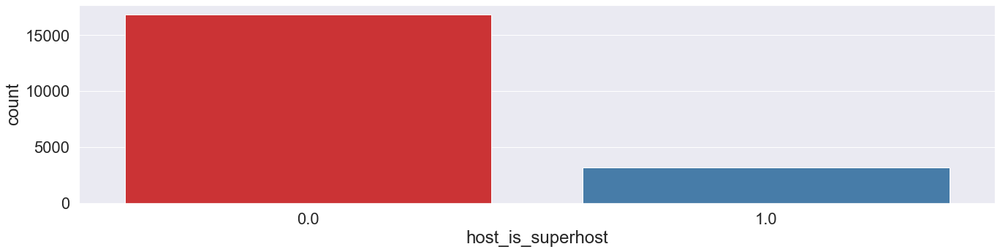

In [87]:
fig, ax = plt.subplots(figsize=(20,5))
sns.countplot(x=df['host_is_superhost'].dropna(),data=df, palette="Set1")

# Correlations

We will use spearman since the data is not normally distributed

In [197]:
corr = df.corr(method = 'spearman')
corr.style.background_gradient(cmap='coolwarm').set_precision(4)

Creating a correlation dataframe showing correlations and the significant levels between numerical features:

In [198]:
from scipy import stats
df_corr= pd.DataFrame(columns=('v1','v2','abscorr','origcorr','pval'))

for i in df_num:
        for j in df_num:
                if i > j:
                        a=stats.spearmanr(df[i], df[j],nan_policy='omit')
                        b="{}/{}".format(i,j)
                        df_corr.loc[b] =[i,j,abs(a[0]),a[0],a[1]]
    
df_corr_filtered= df_corr.loc[(df_corr['abscorr']>0.7 ) & (df_corr['pval']<0.05)]
df_corr_filtered.sort_values(by=['abscorr'],ascending=False)

,v1,v2,abscorr,origcorr,pval
years_of_hosting/host_id,years_of_hosting,host_id,0.979773,-0.979773,0.0
availability_90/availability_60,availability_90,availability_60,0.973189,0.973189,0.0
_'selfie'/_'identity_manual',_'selfie',_'identity_manual',0.972309,0.972309,0.0
refrigerator/dishes_and_silverware,refrigerator,dishes_and_silverware,0.952844,0.952844,0.0
availability_60/availability_30,availability_60,availability_30,0.924428,0.924428,0.0
host_total_listings_count/calculated_host_listings_count,host_total_listings_count,calculated_host_listings_count,0.919196,0.919196,0.0
'phone'/'email','phone','email',0.906249,-0.906249,0.0
availability_90/availability_365,availability_90,availability_365,0.897070,0.897070,0.0
stove/oven,stove,oven,0.895194,0.895194,0.0
dishes_and_silverware/cooking_basics,dishes_and_silverware,cooking_basics,0.884782,0.884782,0.0


In [ ]:
# corr to explore beds/accommodates, reviews_per_month/qnum_since_last_review

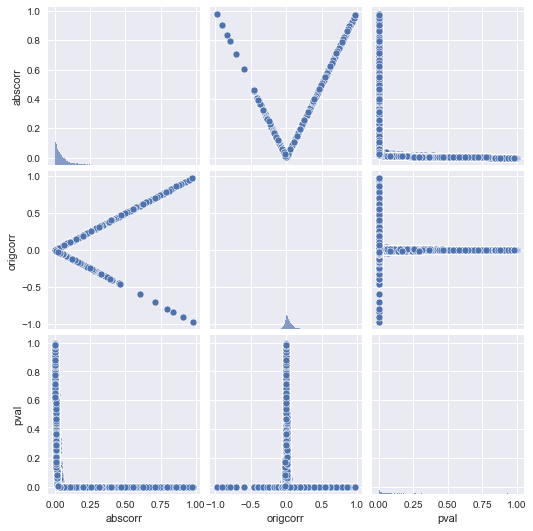

In [14]:
sns.pairplot(df_corr)

Chi-square test for relationships between dummy variables:

In [125]:
#def cramers_corrected_stat(df):
#    chi2_df = pd.DataFrame(columns=['var1','var2','p-value','Chi2 Statistic'])
#    for i in df:
#        if ((i in df_dummy.columns or i in df_categorial.columns) and i != 'host_is_superhost'):
#            for j in df:
#                if (i in df_dummy.columns or i in df_categorial.columns) and j != 'host_is_superhost' and i < j:
#                    confusion_matrix = pd.crosstab(df[i], df[j])
#                    chi_res = chi2_contingency(confusion_matrix)
#                    b = "{}/{}".format(i,j)
#                    if chi_res[1] < 0.05:
#                        chi2_df.loc[b] = [i,j,chi_res[1],chi_res[0]]
                    
#    return chi2_df.sort_values(by='p-value')

#chi2_df = cramers_corrected_stat(df)
#chi2_df_main = chi2_df.head()

In [59]:
#chi2_df_main

,var1,var2,p-value,Chi2 Statistic
flat_path_to_front_door/well_lit_path_to_entrance,flat_path_to_front_door,well_lit_path_to_entrance,0.0,5648.211701
kitchen/room_type,kitchen,room_type,0.0,3967.879803
kitchen/property_type,kitchen,property_type,0.0,2860.101566
neighbourhood/review_scores_accuracy,neighbourhood,review_scores_accuracy,0.0,2962.545850
changing_table/outlet_covers,changing_table,outlet_covers,0.0,4462.421742


Spearman Correlations with the Target Value - Host is Superhost

In [199]:
df_target= pd.DataFrame(columns=('abscorr','origcorr','pval'))

for i in df_num:
       
                if i != 'host_is_superhost':
                        a=stats.spearmanr(df[i], df['host_is_superhost'],nan_policy='omit')
                        b="{}/host_is_superhost".format(i,j)
                        df_target.loc[b] =[abs(a[0]),a[0],a[1]]
                        
df_target= df_target.loc[(df_target['abscorr']<0.7 ) & (df_target['pval']<0.05)]
df_target.sort_values(by=['abscorr'],ascending=False)

,abscorr,origcorr,pval
number_of_reviews/host_is_superhost,0.389872,0.389872,0.000000e+00
reviews_per_month/host_is_superhost,0.379042,0.379042,0.000000e+00
hot_water/host_is_superhost,0.204013,0.204013,3.899844e-187
review_scores_cleanliness/host_is_superhost,0.193261,0.193261,6.992178e-146
review_scores_accuracy/host_is_superhost,0.185138,0.185138,8.117712e-134
...,...,...,...
pets_allowed/host_is_superhost,0.015533,0.015533,2.793853e-02
bathtub/host_is_superhost,0.015098,0.015098,3.263604e-02
air_conditioning/host_is_superhost,0.014555,0.014555,3.942113e-02
other/host_is_superhost,0.014199,0.014199,4.449778e-02


number_of_reviews and reviews_per_months has an expected relation. Let's reflect one of them

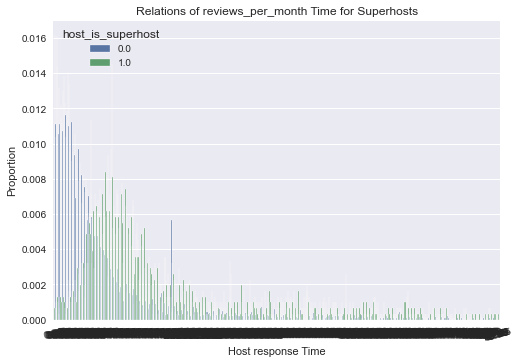

In [200]:
x, y, hue = "reviews_per_month", "Proportion", "host_is_superhost"
prop_df = (df[x]
           .groupby(df[hue])
           .value_counts(normalize=True)
           .rename(y)
           .reset_index())
sns.barplot(x=x, y=y, hue=hue, data=prop_df)
#plt.legend(title=i, loc='upper right', labels=['Yes', 'No'])
plt.xticks(rotation=15)
plt.xlabel('Host response Time')
plt.title('Relations of reviews_per_month Time for Superhosts')
plt.show()

For relationships between dummy and categorical variables and host_is_superhost we'll use one-way ANOVA, with log(host_is_superhost) as input:

In [201]:
from scipy.stats import f_oneway
df_anova_dummy=pd.DataFrame(columns=('category','cor','pval'))
names=df_categorial.columns

for i in names:
    if i != 'host_is_superhost':
        CategoryGroupList=df.groupby(i)['host_is_superhost'].apply(list)
        AnovaResults=f_oneway(*CategoryGroupList)
        anova=AnovaResults[0]
        pval=AnovaResults[1]
        b="{}/host_is_superhost".format(i)
        df_anova_dummy.loc[b]=[i,anova,pval]
        
        df_anova_dummy_filtered=df_anova_dummy.loc[(df_anova_dummy['pval']<0.05)]

In [76]:
df_anova_dummy.to_csv('amsterdam_avona_dummy.csv')

In [64]:
df_anova_dummy_filtered.sort_values(by=['cor'],ascending=False)

,category,cor,pval
host_response_time/host_is_superhost,host_response_time,70.651491,3.118953e-45
host_neighbourhood/host_is_superhost,host_neighbourhood,5.545579,3.059733e-32
host_location/host_is_superhost,host_location,3.503565,6.412931e-05


Visualizing the Anova with correleted values: dummies and target value

<AxesSubplot:xlabel='host_response_time', ylabel='host_is_superhost'>

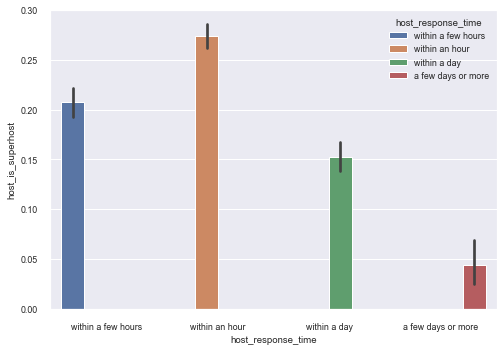

In [64]:
sns.barplot(data=df,y='host_is_superhost',hue='host_response_time',x=i)

Correlatin of Superhost and Host Neigbohorhood
#aggrigarte room to conclude

<AxesSubplot:xlabel='host_is_superhost', ylabel='host_neighbourhood'>

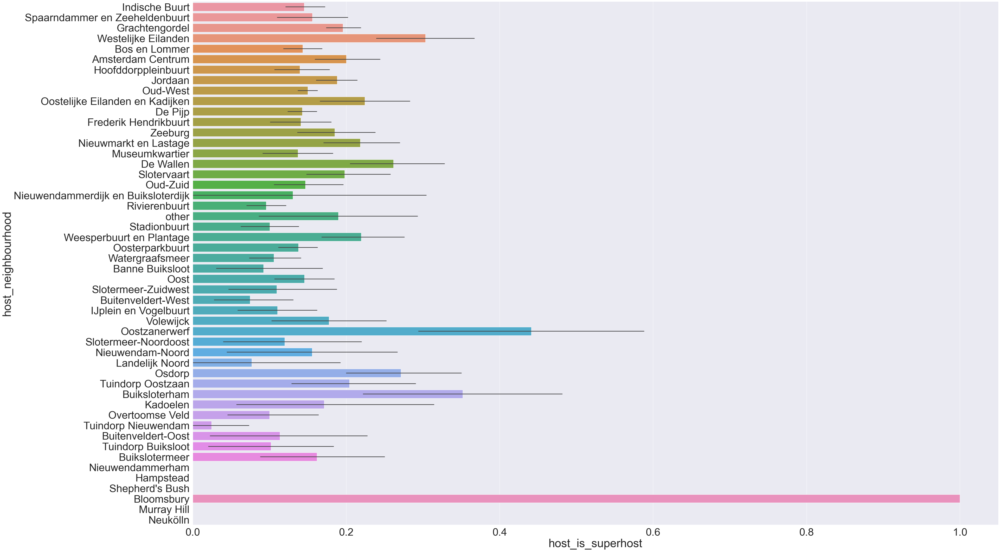

In [61]:
sns.set(rc = {'figure.figsize':(60,40)})
sns.set(font_scale = 4)
sns.barplot(data=df,x='host_is_superhost',y='host_neighbourhood')


Bloomsbury UK Nieuwendammerdijk en Buiksloterdijk

Correlatin of Superhost and Host Location

<AxesSubplot:xlabel='host_is_superhost', ylabel='host_location'>

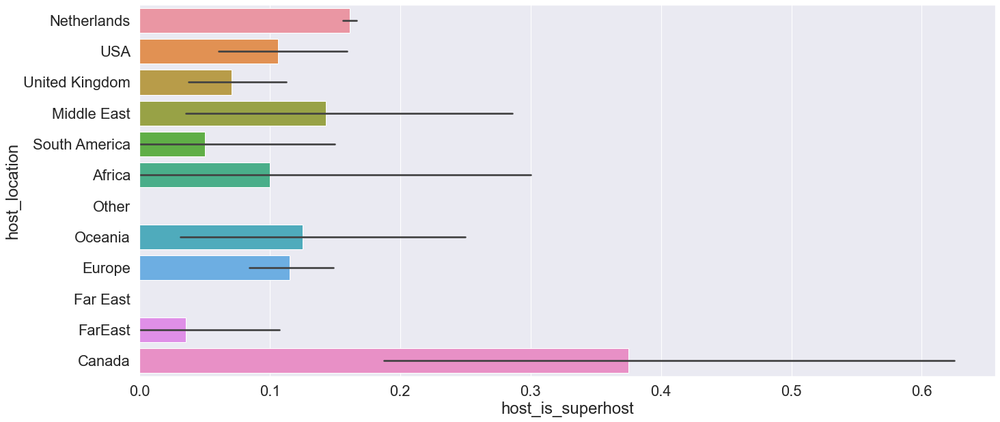

In [148]:
sns.set(rc = {'figure.figsize':(20,10)})
sns.set(font_scale = 2)
sns.barplot(data=df,x='host_is_superhost',y='host_location')

There is a segnificant correlation Canadians hosts....

# Next to outliers